In [1]:
import os
import math
import glob

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2

%matplotlib inline

This image is: <class 'numpy.ndarray'> with dimesions: (720, 1280, 3)


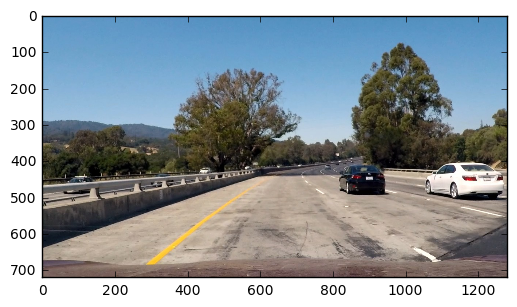

In [2]:
image = mpimg.imread('test_images/test1.jpg')
print('This image is:', type(image), 'with dimesions:', image.shape)
plt.imshow(image);

# Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

In [99]:
def load_imgs(path):
    files =  glob.glob(path) 
    imgs = [mpimg.imread(img_path) for img_path in files ]
    return imgs

def plot_imgs(imgs, cmap=None, titles=None):
    titles = titles or ['']*len(imgs) 
    columns = min(len(imgs), 5)
    rows = math.ceil(len(imgs) / columns)
    plt.figure(figsize=(16,8))
    for i, img in enumerate(imgs):
        plt.subplot(rows, columns, i+1)
        plt.imshow(img, cmap=cmap)
        plt.title(titles[i])
    plt.show()

def calc_undistort(imgs):
    CROSSES = (6, 9)
    gray_images = [cv2.cvtColor(i, cv2.COLOR_RGB2GRAY) for i in imgs]
    objpoints = []
    imgpoints = []
    
    objp = np.zeros((CROSSES[0]*CROSSES[1], 3), np.float32)
    objp[:,:2] = np.mgrid[0:CROSSES[0], 0:CROSSES[1]].T.reshape(-1, 2) # x, y coordinates

    for i, gray in enumerate(gray_images):
        ret, corners = cv2.findChessboardCorners(gray, CROSSES, None)
        if ret:
            imgs[i] = cv2.drawChessboardCorners(imgs[i], CROSSES, corners, ret)
            imgpoints.append(corners)
            objpoints.append(objp)
            
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)
    imgs = [cv2.undistort(img, mtx, dist, None, mtx) 
            for img in imgs]
            
    return imgs, mtx, dist

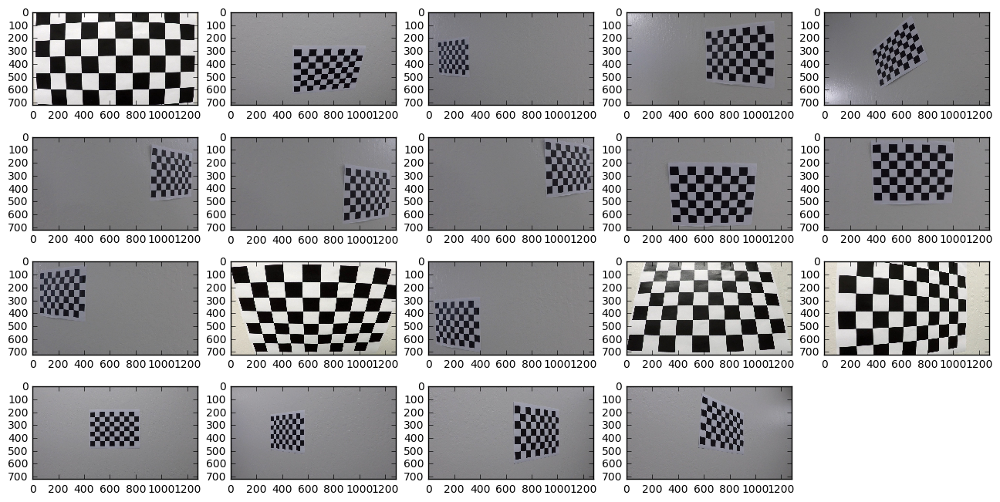

Undistorted images and found crosses.


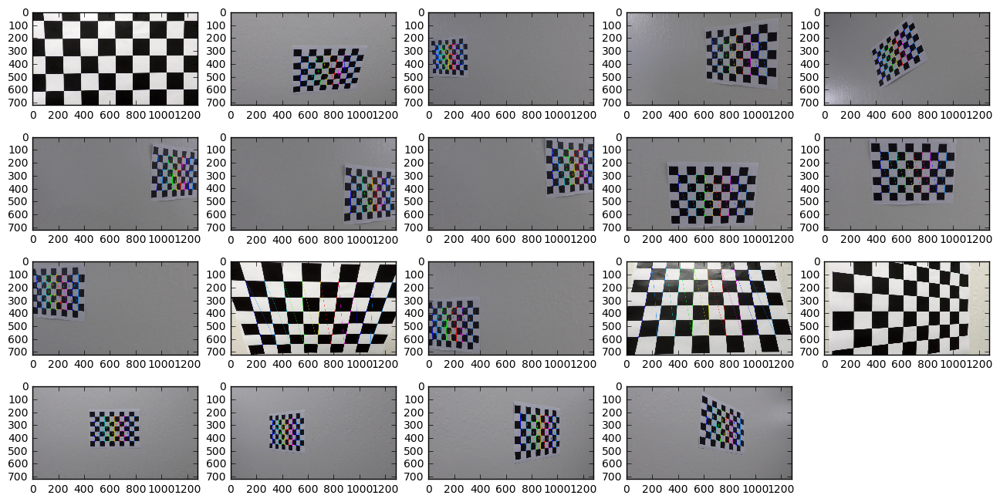

In [4]:
calibration_imgs = load_imgs('./camera_cal/calibration*.jpg')
plot_imgs(calibration_imgs)
undistorded_imgs, mtx, dist = calc_undistort(calibration_imgs)
print('Undistorted images and found crosses.')
plot_imgs(undistorded_imgs)

# Apply the distortion correction to the raw image.

In [5]:
def undistort_img(img, mtx, dist):
    undist = cv2.undistort(img, mtx, dist, None, mtx) 
    return undist

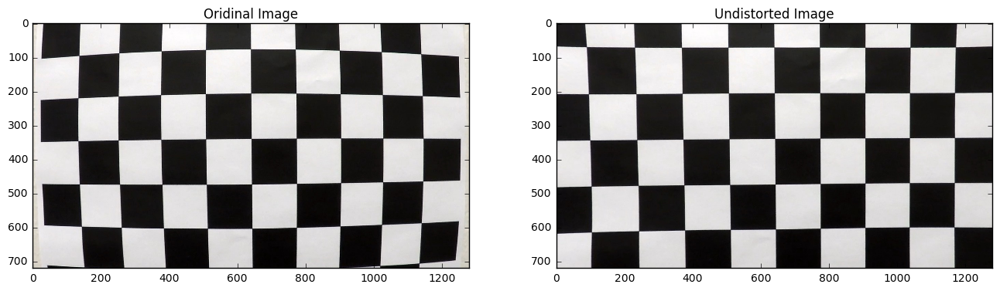

In [100]:
image = calibration_imgs[0]
plot_imgs([image, undistort_img(image, mtx, dist)], None, ['Oridinal Image', 'Undistorted Image'])

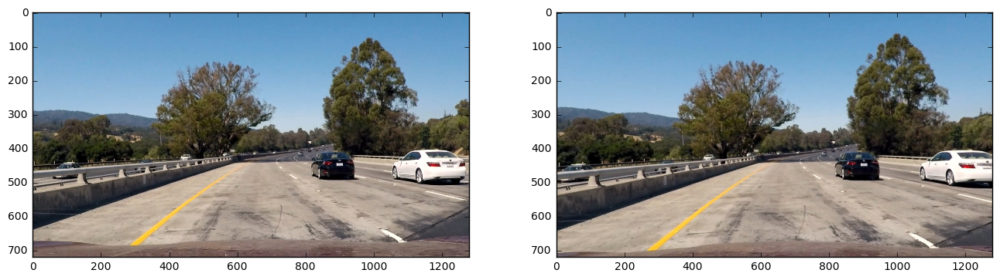

In [7]:
image = mpimg.imread('test_images/test1.jpg')
image_2 = undistort_img(image, mtx, dist)
plot_imgs([image, image_2])

In [22]:
def weighted_img(img, initial_img, α=0.8, β=1., λ=0.):
    """
    'img' is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    'initial_img' should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + λ
    NOTE: initial_img and img must be the same shape!
    e.g. usage: # image =  weighted_img(image, image_orig, α=0.5, β=0.5, λ=0.)
    """
    return cv2.addWeighted(initial_img, α, img, β, λ)


## Apply a perspective transform to rectify binary image ("birds-eye view").

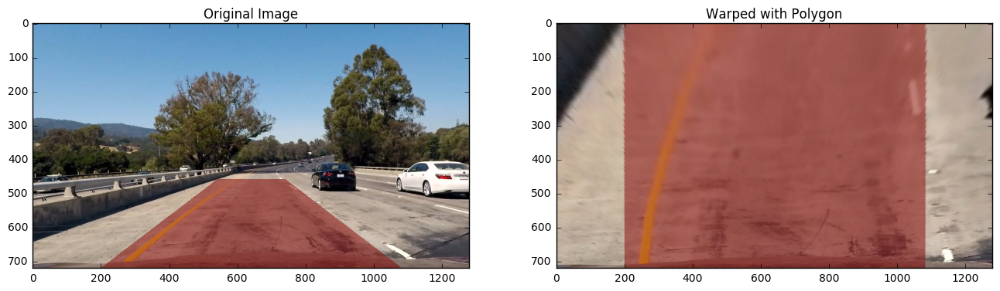

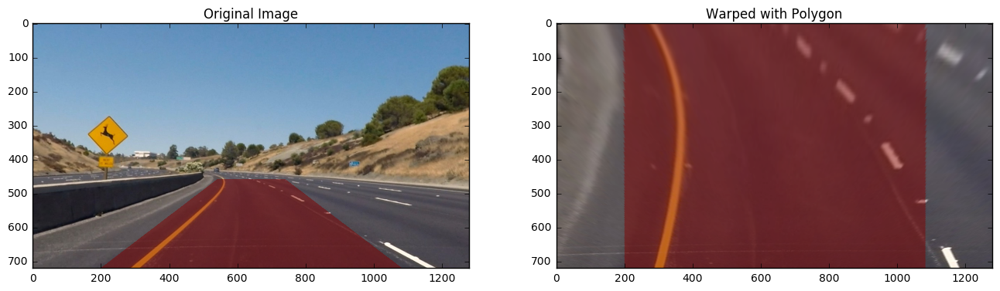

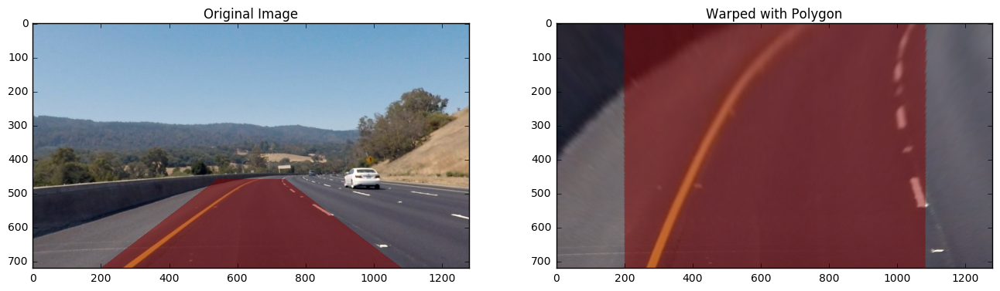

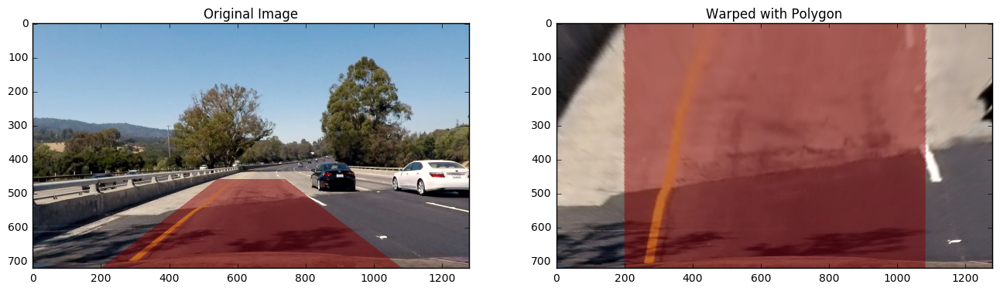

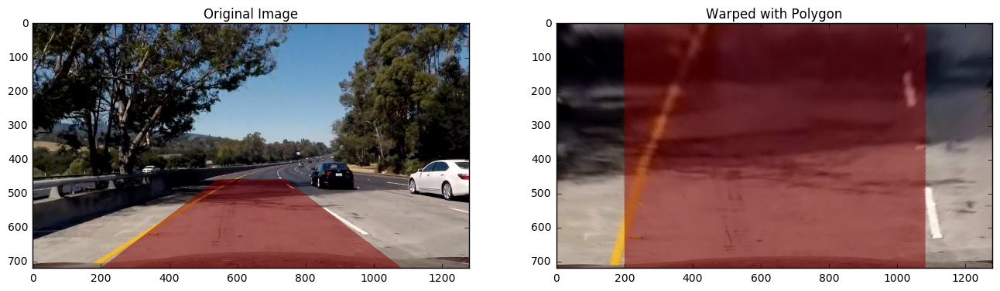

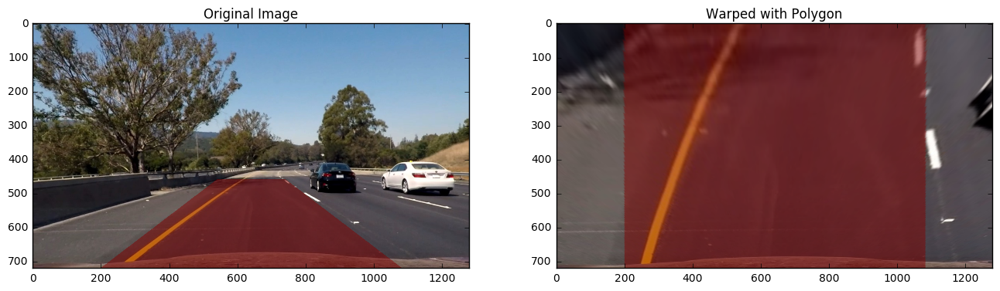

In [101]:
def apply_perspective_transform(img, plot=False):

    y, x = img.shape[:2]

    src = np.float32(
        [[200, y],
         [x/2-100, y/2 + 100],
         [x/2+100, y/2 + 100],
         [x-200, y],
        ])

    dst = np.float32(
        [[200, y],
         [200, 0],
         [x-200, 0],
         [x-200, y],
         ])
    
    # For debug to see coordinates
    if False:
        plt.figure();
        plt.hold(True);
        plt.imshow(img);
        plt.grid();

        for p in src:
            plt.plot(p[0], p[1], '.', c='r');

        for p in dst:
            plt.plot(p[0], p[1], '.', c='g');

    M = cv2.getPerspectiveTransform(src, dst)

    warped = cv2.warpPerspective(img, M, (x,y), flags=cv2.INTER_LINEAR)
    if plot:
        image_poly = cv2.fillConvexPoly(np.copy(img), src.astype(np.int32), 128)
        image_poly = weighted_img(image_poly, img, α=0.5, β=0.5, λ=0.)
        warped_polygon = cv2.warpPerspective(image_poly, M, (x,y), flags=cv2.INTER_LINEAR)
        plot_imgs([image_poly, warped_polygon], None, ['Original Image', 'Warped with Polygon'])
    
    return warped
    
imgs = load_imgs('./test_images/test*.jpg')
    
# Plot perspective transform for all test images
for image in imgs:
    image = undistort_img(image, mtx, dist)
    image = apply_perspective_transform(image, True)

# TODO: When you apply a perspective transform, choosing four source points manually is often not the best option. 
# There are many other ways to select source points. For example, many perspective transform algorithms will programmatically detect four source points in an image based on edge or corner detection and analyzing attributes like color and surrounding pixels.


# Use color transforms, gradients, etc., to create a thresholded binary image.

In [ ]:
Camera calibration - check
Distortion correction - check
Color/gradient threshold - check
Perspective transform - check


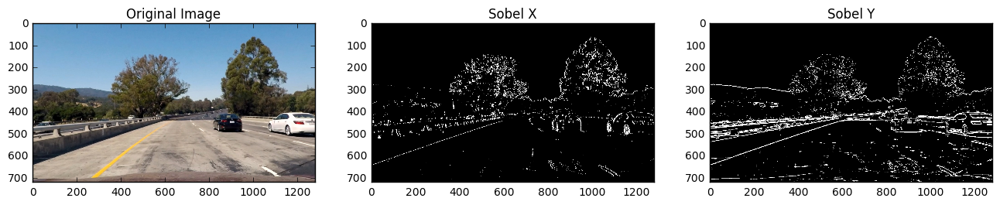

In [79]:
# Sobel derivates of the image
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, threshold=(30, 200)):
    # Convert to grayscale
    thresh_min, thresh_max = threshold
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Return the result
    return binary_output

image = mpimg.imread('test_images/test1.jpg')
image = undistort_img(image, mtx, dist)
# image = apply_perspective_transform(image)

sxbinary = abs_sobel_thresh(image, orient='x')
sybinary = abs_sobel_thresh(image, orient='y')

# show images
plt.figure(figsize=(16,8)); 
plt.subplot(1, 3, 1);
plt.title("Original Image")
plt.imshow(image);
plt.subplot(1, 3, 2);
plt.title("Sobel X")
plt.imshow(sxbinary, cmap='gray');
plt.subplot(1, 3, 3);
plt.title("Sobel Y")
plt.imshow(sybinary, cmap='gray');

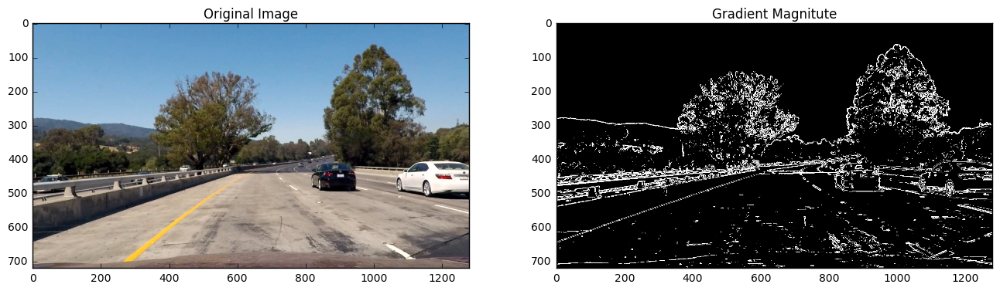

In [69]:
# Define a function to return the magnitude of the gradient
# for a given sobel kernel size and threshold values
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output


image = mpimg.imread('test_images/test1.jpg')
image = undistort_img(image, mtx, dist)
# image = apply_perspective_transform(image)

mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(30, 100))

# show images
plt.figure(figsize=(16,8));
plt.subplot(1,2,1)
plt.title("Original Image")
plt.imshow(image);
plt.subplot(1,2,2)
plt.title("Gradient Magnitute")
plt.imshow(mag_binary, cmap='gray');


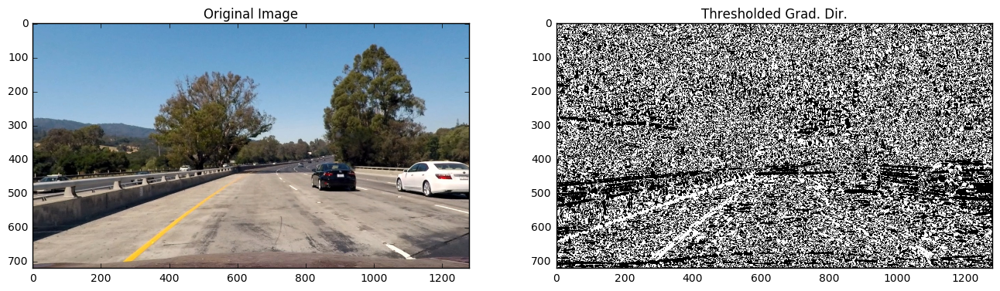

In [70]:
# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output
    
image = mpimg.imread('test_images/test1.jpg')
image = undistort_img(image, mtx, dist)

dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.3))

# show images
plt.figure(figsize=(16,8));
plt.subplot(1,2,1)
plt.title("Original Image")
plt.imshow(image);
plt.subplot(1,2,2)
plt.title("Thresholded Grad. Dir.")
plt.imshow(dir_binary, cmap='gray');


In [78]:
# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements

# Apply each of the thresholding functions
gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, threshold=(0, 255))
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, threshold=(0, 255))
mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(0, 255))
dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0, np.pi/2))

# TODO:
# Try different combinations and see what you get. For example, here is a selection for pixels where both the x and y gradients meet the threshold criteria, or the gradient magnitude and direction are both within their threshold values.

combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
# Here is an example of a binary result from multiple thresholds.

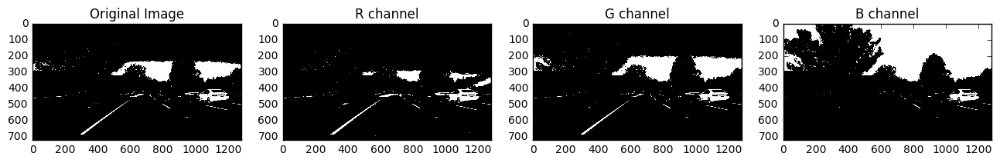

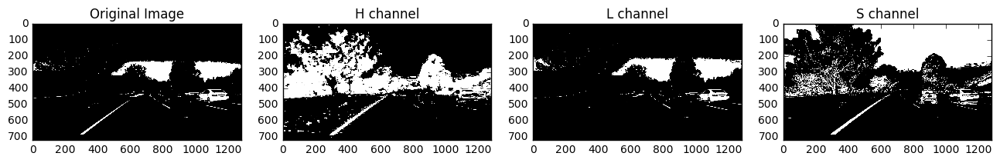

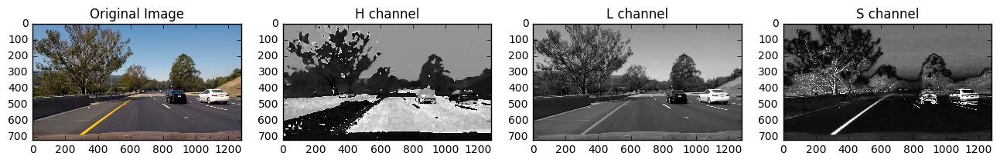

In [97]:
image = mpimg.imread('test_images/test6.jpg')

thresh = (180, 255)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
binary = np.zeros_like(gray)
binary[(gray > thresh[0]) & (gray <= thresh[1])] = 1

R = image[:,:,0]
G = image[:,:,1]
B = image[:,:,2]

R_binary = np.zeros_like(gray)
R_binary[(R > thresh[0]) & (R <= thresh[1])] = 1
G_binary = np.zeros_like(gray)
G_binary[(G > thresh[0]) & (G <= thresh[1])] = 1
B_binary = np.zeros_like(gray)
B_binary[(B > thresh[0]) & (B <= thresh[1])] = 1

# show images
plt.figure(figsize=(16,8));
plt.subplot(1,4,1)
plt.title("Original Image")
plt.imshow(binary, cmap='gray');
plt.subplot(1,4,2)
plt.title("R channel")
plt.imshow(R_binary, cmap='gray');
plt.subplot(1,4,3)
plt.title("G channel")
plt.imshow(G_binary, cmap='gray');
plt.subplot(1,4,4)
plt.title("B channel")
plt.imshow(B_binary, cmap='gray');

# HLS

hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
H = hls[:,:,0]
L = hls[:,:,1]
S = hls[:,:,2]



thresh = (15, 100)
H_binary = np.zeros_like(gray)
H_binary[(H > thresh[0]) & (H <= thresh[1])] = 1

thresh = (180, 255)
L_binary = np.zeros_like(gray)
L_binary[(L > thresh[0]) & (L <= thresh[1])] = 1

thresh = (90, 255)
S_binary = np.zeros_like(gray)
S_binary[(S > thresh[0]) & (S <= thresh[1])] = 1

# show HLS bimnary images
plt.figure(figsize=(16,8));
plt.subplot(1,4,1)
plt.title("Original Image")
plt.imshow(binary, cmap='gray');
plt.subplot(1,4,2)
plt.title("H channel")
plt.imshow(H_binary, cmap='gray');
plt.subplot(1,4,3)
plt.title("L channel")
plt.imshow(L_binary, cmap='gray');
plt.subplot(1,4,4)
plt.title("S channel")
plt.imshow(S_binary, cmap='gray');

# show HLS original images
plt.figure(figsize=(16,8));
plt.subplot(1,4,1)
plt.title("Original Image")
plt.imshow(image);
plt.subplot(1,4,2)
plt.title("H channel")
plt.imshow(H, cmap='gray');
plt.subplot(1,4,3)
plt.title("L channel")
plt.imshow(L, cmap='gray');
plt.subplot(1,4,4)
plt.title("S channel")
plt.imshow(S, cmap='gray');

# TODO: DO it in a function

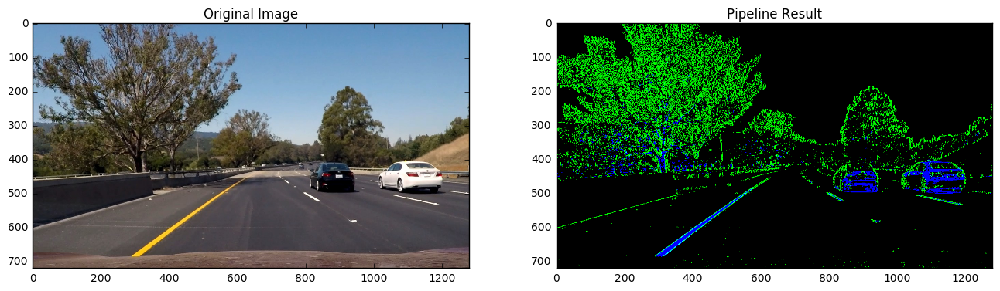

In [98]:
# TODO: Create a pipeline for binary threshold image
def pipeline(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
    return color_binary
    
result = pipeline(image)

# show images
plt.figure(figsize=(16,8));
plt.subplot(1,2,1)
plt.title("Original Image")
plt.imshow(image);
plt.subplot(1,2,2)
plt.title("Pipeline Result")
plt.imshow(result, cmap='gray');
